In [ ]:
Importing Necessary Packages

In [2]:
# data loading and computing functionality
import pandas as pd
import numpy as np
import scipy as sp

# datasets in sklearn package
from sklearn.datasets import load_digits

# visualization packages
import seaborn as sns
import matplotlib.pyplot as plt

#PCA, SVD, LDA
from sklearn.decomposition import PCA
from scipy.linalg import svd
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

#### 1. Loading data, determining samples, attributes, and types of attributes

Use the 'diabetes' data available at https://notebooks.azure.com/chriran/projects/mlcoachprimers-june/html/data/diabetes.csv
Download the data to your local space and read it.

<span style="color:red">**Questions:** </span> 
- Where is the data obtained from?
- What does the data capture?
- How many data points are there? 
- What is the dimensionality? 
- What type of attributes are present in the dataset? 

<span style = "color:blue">**Answers** </span>

In [3]:
df = pd.read_csv('diabetes.csv')

In [4]:
type(df)

pandas.core.frame.DataFrame

In [5]:
df.shape

(15000, 10)

In [6]:
df.dtypes

PatientID                   int64
Pregnancies                 int64
PlasmaGlucose               int64
DiastolicBloodPressure      int64
TricepsThickness            int64
SerumInsulin                int64
BMI                       float64
DiabetesPedigree          float64
Age                         int64
Diabetic                    int64
dtype: object

In [7]:
df.head()

,PatientID,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age,Diabetic
0,1354778,0,171,80,34,23,43.509726,1.213191,21,0
1,1147438,8,92,93,47,36,21.240576,0.158365,23,0
2,1640031,7,115,47,52,35,41.511523,0.079019,23,0
3,1883350,9,103,78,25,304,29.582192,1.282870,43,1
4,1424119,1,85,59,27,35,42.604536,0.549542,22,0


<span style = "color:blue">**Answers** </span>

- This dataset is obtained from the National Institute of Diabetes and Digestive and Kidney Diseases.
- The data captures 
PatientID                   int64
Pregnancies                 int64
PlasmaGlucose               int64
DiastolicBloodPressure      int64
TricepsThickness            int64
SerumInsulin                int64
BMI                       float64
DiabetesPedigree          float64
Age                         int64
Diabetic                    int64
- There are 15000 data points in the data set
- There are 10 dimensions in the data set, 8 of which are integer and two are real.


In [8]:
df.tail()

,PatientID,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age,Diabetic
14995,1490300,10,65,60,46,177,33.512468,0.148327,41,1
14996,1744410,2,73,66,27,168,30.132636,0.862252,38,1
14997,1742742,0,93,89,43,57,18.690683,0.427049,24,0
14998,1099353,0,132,98,18,161,19.791645,0.302257,23,0
14999,1386396,3,114,65,47,512,36.215437,0.147363,34,1


In [9]:
df.describe()

,PatientID,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age,Diabetic
count,1.500000e+04,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,1.502922e+06,3.224533,107.856867,71.220667,28.814000,137.852133,31.509646,0.398968,30.137733,0.333333
std,2.892534e+05,3.391020,31.981975,16.758716,14.555716,133.068252,9.759000,0.377944,12.089703,0.471420
min,1.000038e+06,0.000000,44.000000,24.000000,7.000000,14.000000,18.200512,0.078044,21.000000,0.000000
25%,1.252866e+06,0.000000,84.000000,58.000000,15.000000,39.000000,21.259887,0.137743,22.000000,0.000000
50%,1.505508e+06,2.000000,104.000000,72.000000,31.000000,83.000000,31.767940,0.200297,24.000000,0.000000
75%,1.755205e+06,6.000000,129.000000,85.000000,41.000000,195.000000,39.259692,0.616285,35.000000,1.000000
max,1.999997e+06,14.000000,192.000000,117.000000,93.000000,799.000000,56.034628,2.301594,77.000000,1.000000


### 2. Generating summary statistics

Use 'diabetes' data. Do not include PatientID attribute in this analysis. 

<span style="color:red">**Questions:** </span> 
- What are range of values these numeric attributes take? 
- What different values do categorical attributes take? 
- What are is mean values for each of the attributes?
- What are is variance for each of the attributes?
- How is the data distributed for each of these attributes?

<span style = "color:blue">**Answers** </span>
- The range of these attributes can be calculated with the help of the describe function given below.
- The categorical attribute Diabetic takes the values 0 and 1.
- The mean values for various attributes are also given below using the describe function
- Variance is just the square of the standard deviation given in the table below. Standard deviation is used as it is the normalized form of variance.
- The distibution of the data is also given below, the table shows the mean, standard deviation, minimum, median,maximum values the attributes take. Also, the distribution can be visualized with the help of the histograms and density distributions shown below using distplots.

In [13]:
df.iloc[:,1:10].describe()

,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age,Diabetic
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,3.224533,107.856867,71.220667,28.814000,137.852133,31.509646,0.398968,30.137733,0.333333
std,3.391020,31.981975,16.758716,14.555716,133.068252,9.759000,0.377944,12.089703,0.471420
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200512,0.078044,21.000000,0.000000
25%,0.000000,84.000000,58.000000,15.000000,39.000000,21.259887,0.137743,22.000000,0.000000
50%,2.000000,104.000000,72.000000,31.000000,83.000000,31.767940,0.200297,24.000000,0.000000
75%,6.000000,129.000000,85.000000,41.000000,195.000000,39.259692,0.616285,35.000000,1.000000
max,14.000000,192.000000,117.000000,93.000000,799.000000,56.034628,2.301594,77.000000,1.000000


In [11]:
df.iloc[:,1:10].describe(include='all')

,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age,Diabetic
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,3.224533,107.856867,71.220667,28.814000,137.852133,31.509646,0.398968,30.137733,0.333333
std,3.391020,31.981975,16.758716,14.555716,133.068252,9.759000,0.377944,12.089703,0.471420
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200512,0.078044,21.000000,0.000000
25%,0.000000,84.000000,58.000000,15.000000,39.000000,21.259887,0.137743,22.000000,0.000000
50%,2.000000,104.000000,72.000000,31.000000,83.000000,31.767940,0.200297,24.000000,0.000000
75%,6.000000,129.000000,85.000000,41.000000,195.000000,39.259692,0.616285,35.000000,1.000000
max,14.000000,192.000000,117.000000,93.000000,799.000000,56.034628,2.301594,77.000000,1.000000


In [14]:
from pandas.api.types import is_numeric_dtype

for col in df.columns:
    if is_numeric_dtype(df[col]):
        print('%s:' % (col))
        print('\t Mean = %.2f' % df[col].mean())
        print('\t Standard deviation = %.2f' % df[col].std())
        print('\t Variance = %.2f' % df[col].var())
        print('\t Minimum = %.2f' % df[col].min())
        print('\t Maximum = %.2f' % df[col].max())

PatientID:
	 Mean = 1502922.00
	 Standard deviation = 289253.44
	 Variance = 83667554559.94
	 Minimum = 1000038.00
	 Maximum = 1999997.00
Pregnancies:
	 Mean = 3.22
	 Standard deviation = 3.39
	 Variance = 11.50
	 Minimum = 0.00
	 Maximum = 14.00
PlasmaGlucose:
	 Mean = 107.86
	 Standard deviation = 31.98
	 Variance = 1022.85
	 Minimum = 44.00
	 Maximum = 192.00
DiastolicBloodPressure:
	 Mean = 71.22
	 Standard deviation = 16.76
	 Variance = 280.85
	 Minimum = 24.00
	 Maximum = 117.00
TricepsThickness:
	 Mean = 28.81
	 Standard deviation = 14.56
	 Variance = 211.87
	 Minimum = 7.00
	 Maximum = 93.00
SerumInsulin:
	 Mean = 137.85
	 Standard deviation = 133.07
	 Variance = 17707.16
	 Minimum = 14.00
	 Maximum = 799.00
BMI:
	 Mean = 31.51
	 Standard deviation = 9.76
	 Variance = 95.24
	 Minimum = 18.20
	 Maximum = 56.03
DiabetesPedigree:
	 Mean = 0.40
	 Standard deviation = 0.38
	 Variance = 0.14
	 Minimum = 0.08
	 Maximum = 2.30
Age:
	 Mean = 30.14
	 Standard deviation = 12.09
	 Variance

In [15]:
df['Diabetic'] = df['Diabetic'].astype('category',copy=False)

In [16]:
from pandas.api.types import is_numeric_dtype

for col in df.columns:
    if is_numeric_dtype(df[col]):
        print('%s:' % (col))
        print('\t Mean = %.2f' % df[col].mean())
        print('\t Standard deviation = %.2f' % df[col].std())
        print('\t Variance = %.2f' % df[col].var())
        print('\t Minimum = %.2f' % df[col].min())
        print('\t Maximum = %.2f' % df[col].max())

PatientID:
	 Mean = 1502922.00
	 Standard deviation = 289253.44
	 Variance = 83667554559.94
	 Minimum = 1000038.00
	 Maximum = 1999997.00
Pregnancies:
	 Mean = 3.22
	 Standard deviation = 3.39
	 Variance = 11.50
	 Minimum = 0.00
	 Maximum = 14.00
PlasmaGlucose:
	 Mean = 107.86
	 Standard deviation = 31.98
	 Variance = 1022.85
	 Minimum = 44.00
	 Maximum = 192.00
DiastolicBloodPressure:
	 Mean = 71.22
	 Standard deviation = 16.76
	 Variance = 280.85
	 Minimum = 24.00
	 Maximum = 117.00
TricepsThickness:
	 Mean = 28.81
	 Standard deviation = 14.56
	 Variance = 211.87
	 Minimum = 7.00
	 Maximum = 93.00
SerumInsulin:
	 Mean = 137.85
	 Standard deviation = 133.07
	 Variance = 17707.16
	 Minimum = 14.00
	 Maximum = 799.00
BMI:
	 Mean = 31.51
	 Standard deviation = 9.76
	 Variance = 95.24
	 Minimum = 18.20
	 Maximum = 56.03
DiabetesPedigree:
	 Mean = 0.40
	 Standard deviation = 0.38
	 Variance = 0.14
	 Minimum = 0.08
	 Maximum = 2.30
Age:
	 Mean = 30.14
	 Standard deviation = 12.09
	 Variance

In [17]:
df['Diabetic'].value_counts()

0    10000
1     5000
Name: Diabetic, dtype: int64

Visualizing the data is probably the best way to get an initial idea about the shape and distribution of the data for further Analysis

/usr/local/python/2.7-conda5.2/lib/python2.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


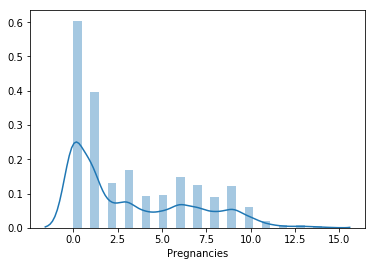

In [17]:
sns.distplot(df['Pregnancies']);

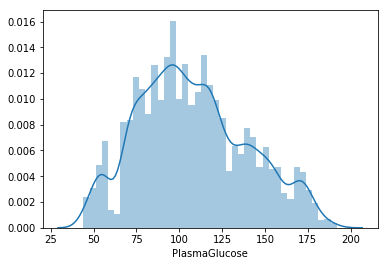

In [18]:
sns.distplot(df['PlasmaGlucose']);

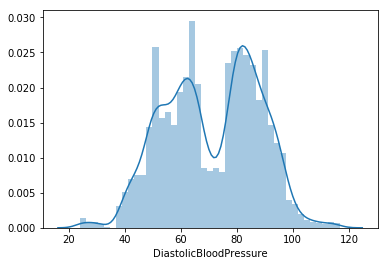

In [19]:
sns.distplot(df['DiastolicBloodPressure']);

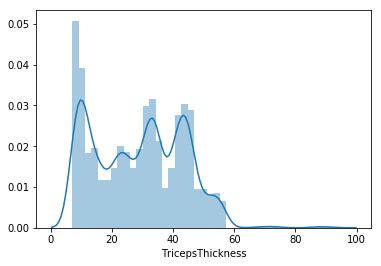

In [20]:
sns.distplot(df['TricepsThickness']);

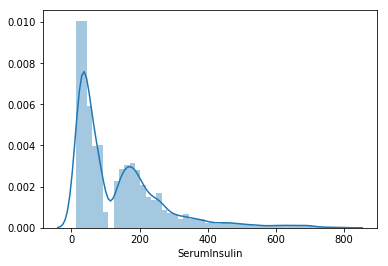

In [21]:
sns.distplot(df['SerumInsulin']);

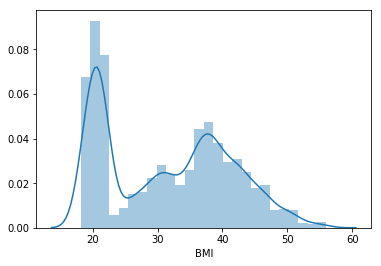

In [22]:
sns.distplot(df['BMI']);

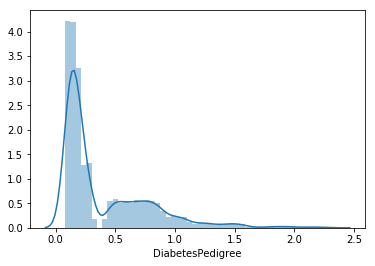

In [23]:
sns.distplot(df['DiabetesPedigree']);

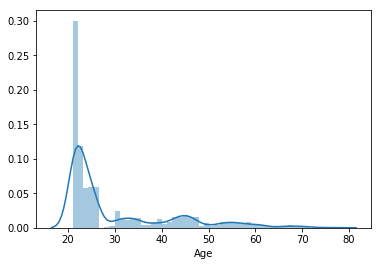

In [24]:
sns.distplot(df['Age'])

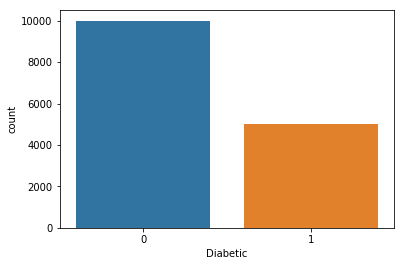

In [25]:
sns.countplot(df['Diabetic']);

### 3. Understanding the (in)dependencies among attributes using Covariance matrix

Use 'diabetes' data. Do not include PatientID and Diabetic attribute in this analysis. 


<span style="color:red">**Questions:** </span> 
- What is the covariance matrix? 
- Which pairs of attributes co-vary?
- Which pairs of attributes have low covariance?
- Which pairs of attributes are highly correlated? 
- Which pairs of attributes are uncorrelated? 
- What information do you gain from a correlation matrix, but not from a covariance matrix?

<span style = "color:blue">**Answers** </span>
- Covariance matrix is nothing but the matrix showing measure of variance-covariance between different attributes present in the data.
- The pair of attributes which have low variance are: Pregnancies & DiabetesPedigree, PlasmaGlucose & DiabetesPedigree, DiastolicBloodPressure & DiabetesPedigree, TricepsThickness & DiabetesPedigree, TricepsThickness & DiabetesPedigree, SerumInsulin & DiabetesPedigree, BMI & DiabetesPedigree, DiabetesPedigree & DiabetesPedigree, Age & DiabetesPedigree.
- There are no pair of attributes that are highly correlated.
- The majority pair of attributes in the correlation matrix are close to zero, which means that they all are highly uncorrelated.
- Correlation matrix is standardized covariance matrix, we can compare different attributes in a standardized way to get correlation which is not explicit with the covariance matrix.

In [18]:
data = df.values[:,1:9]
data

array([[0, 171, 80, ..., 43.50972593, 1.213191354, 21],
       [8, 92, 93, ..., 21.24057571, 0.158364981, 23],
       [7, 115, 47, ..., 41.51152348, 0.079018568, 23],
       ...,
       [0, 93, 89, ..., 18.69068305, 0.427048955, 24],
       [0, 132, 98, ..., 19.7916451, 0.302257208, 23],
       [3, 114, 65, ..., 36.21543653, 0.14736285, 34]], dtype=object)

In [19]:
def mycov(data, col_a, col_b):
    mu = np.mean(data, axis=0) #compute mean
    sum = 0;
    for i in range(0, len(data)):
        sum += ((data[i,col_a] - mu[col_a]) * (data[i,col_b] - mu[col_b]))

    return sum/(len(data)-1)

In [20]:
print('Covariance:')
df.iloc[:,1:10].cov()

Covariance:


,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age
Pregnancies,11.499018,5.910866,2.473685,3.139439,47.148411,2.858772,0.069515,5.615382
PlasmaGlucose,5.910866,1022.846703,3.865442,12.615418,142.760019,6.446154,0.109479,15.026716
DiastolicBloodPressure,2.473685,3.865442,280.854563,2.709158,50.507463,2.596033,0.089299,8.374298
TricepsThickness,3.139439,12.615418,2.709158,211.868862,57.502064,3.515076,-0.005232,10.801805
SerumInsulin,47.148411,142.760019,50.507463,57.502064,17707.159679,66.519054,2.329728,141.581472
BMI,2.858772,6.446154,2.596033,3.515076,66.519054,95.238076,0.106477,7.422307
DiabetesPedigree,0.069515,0.109479,0.089299,-0.005232,2.329728,0.106477,0.142841,0.254201
Age,5.615382,15.026716,8.374298,10.801805,141.581472,7.422307,0.254201,146.160907


In [21]:
print('Correlation:')
df.iloc[:,1:10].corr()

Correlation:


,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age
Pregnancies,1.000000,0.054502,0.043528,0.063605,0.104487,0.086386,0.054240,0.136972
PlasmaGlucose,0.054502,1.000000,0.007212,0.027100,0.033545,0.020653,0.009057,0.038864
DiastolicBloodPressure,0.043528,0.007212,1.000000,0.011106,0.022649,0.015873,0.014099,0.041333
TricepsThickness,0.063605,0.027100,0.011106,1.000000,0.029688,0.024745,-0.000951,0.061383
SerumInsulin,0.104487,0.033545,0.022649,0.029688,1.000000,0.051223,0.046324,0.088007
BMI,0.086386,0.020653,0.015873,0.024745,0.051223,1.000000,0.028868,0.062910
DiabetesPedigree,0.054240,0.009057,0.014099,-0.000951,0.046324,0.028868,1.000000,0.055633
Age,0.136972,0.038864,0.041333,0.061383,0.088007,0.062910,0.055633,1.000000


### 4. Dimensionality Reduction: Feature Selection

**Assumption:** Assume that your goal is to cluster the data to identify the diagnosis 'Diabetic'. Clustering algorithm takes as input data points and attributes. It groups points that are similar to each other into a separate cluster. It puts points that are dissimilar in different cluster. Note that the 'Diabetic' attribute will be hidden from the clustering algorithm.

<span style="color:red">**Questions:** </span> 
- If you are allowed to select only one (out of the four) feature, which feature would be highly useful for the clustering task. Provide a reason.
- If you are allowed to select only two (out of the four) feature, which feature would be highly useful for the clustering task. Provide a reason.
- Note that in real-world problems ground-truth will not be available to select the features, how do you approach the feature selection problem in that case?

<span style = "color:blue">**Answers** </span>
- If we are allowed to choose one variable to cluster, there is no feature that can be used for the clustering task right now with the amount of information we have. We would have to employ more data analysis to reach that conclusion. We can fit different types of clustering models and cross-check our results with the original data with the help of a confusion matrix.
- The answer is the same as the above in the case of selecting two variables.
- There are various ways we can go about this problem. To fit the best model for classification, We can start by fitting a classification model, use dimensionality reduction and variable selection techniques to narrow down on the best fit using the train-test split. We can use various resampling methods like validation set, k fold cross validation, leave one out validation and even bootstrapping. We can also use shrinkage methods and dimensionality reduction. It is completely based on the problem at hand and how it responds to various methods listed above.

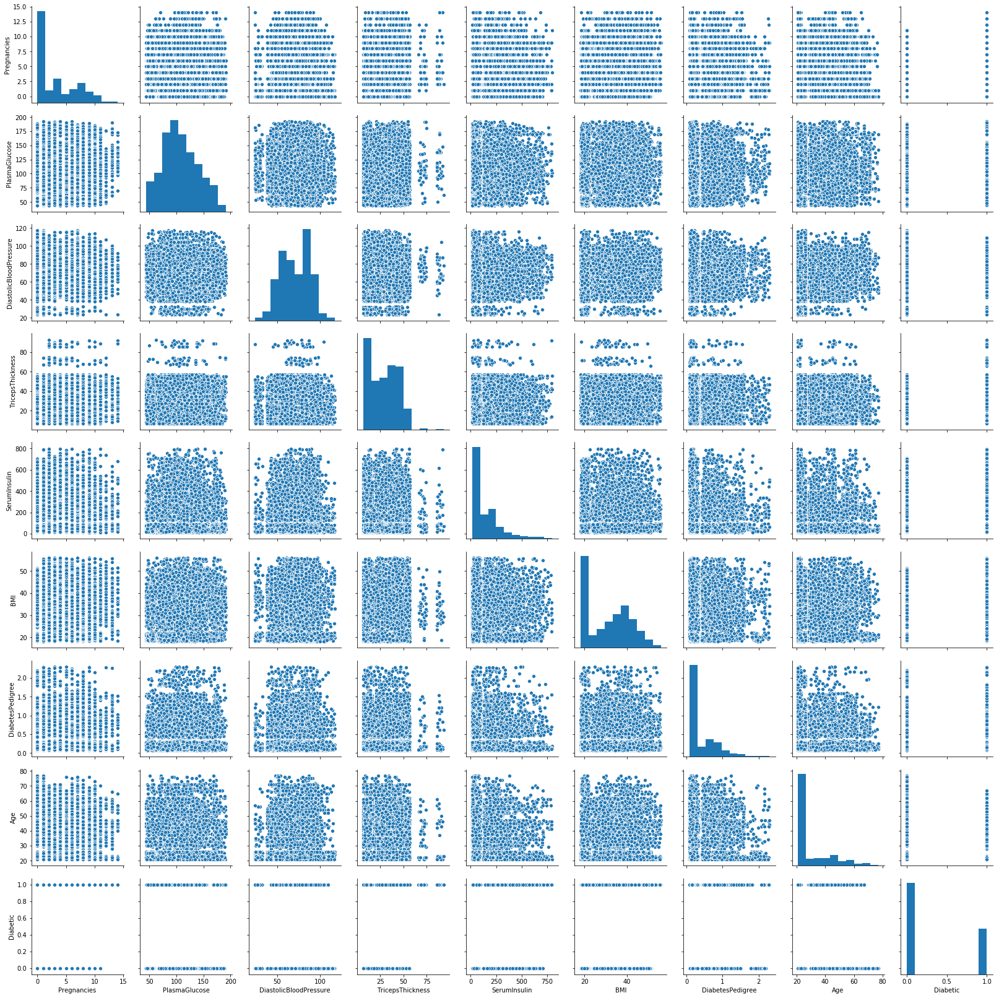

In [40]:
sns.pairplot(df.iloc[:,1:10])

/usr/local/python/2.7-conda5.2/lib/python2.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/usr/local/python/2.7-conda5.2/lib/python2.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/usr/local/python/2.7-conda5.2/lib/python2.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


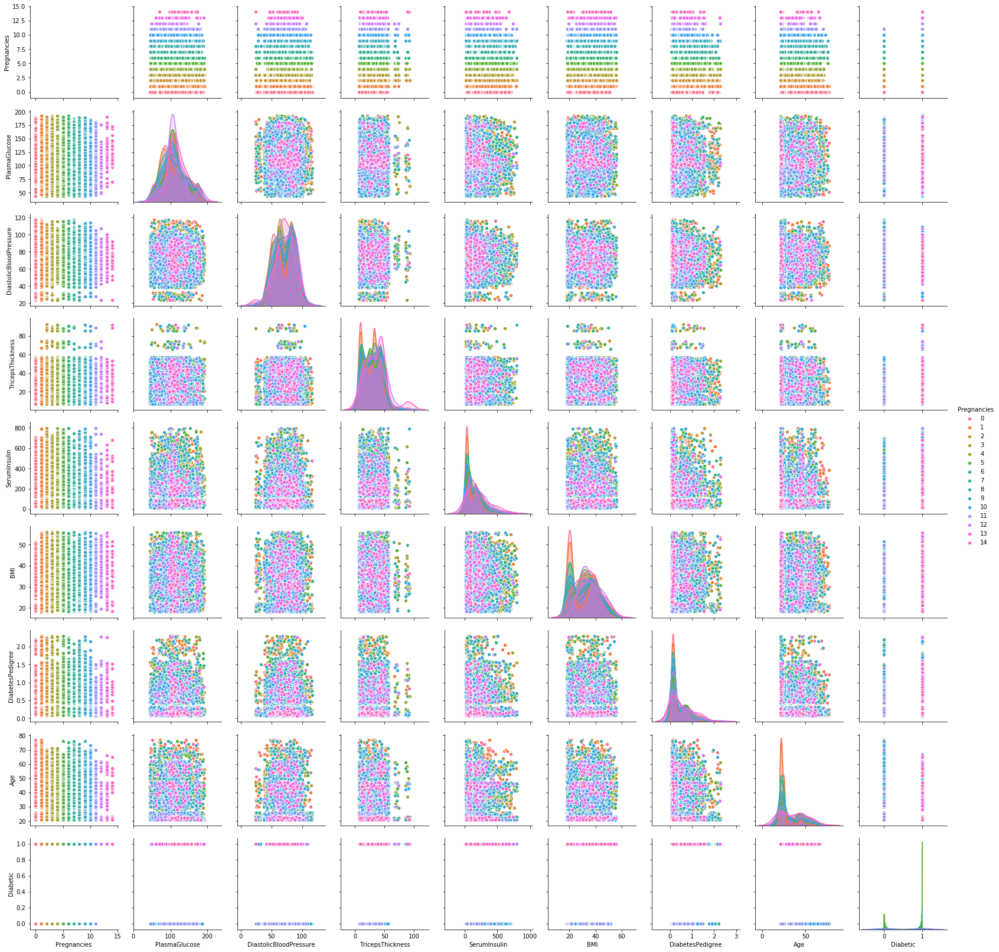

In [30]:
import seaborn as sns
sns.pairplot(df.iloc[:,1:10], hue="Pregnancies")

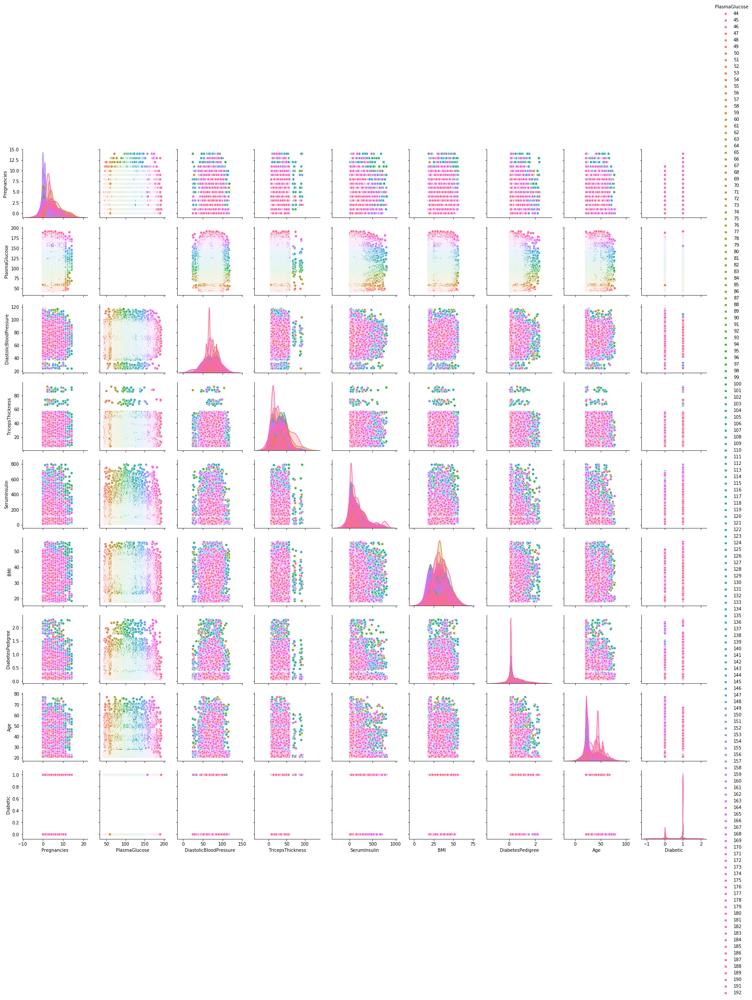

In [31]:
sns.pairplot(df.iloc[:,1:10], hue="PlasmaGlucose")

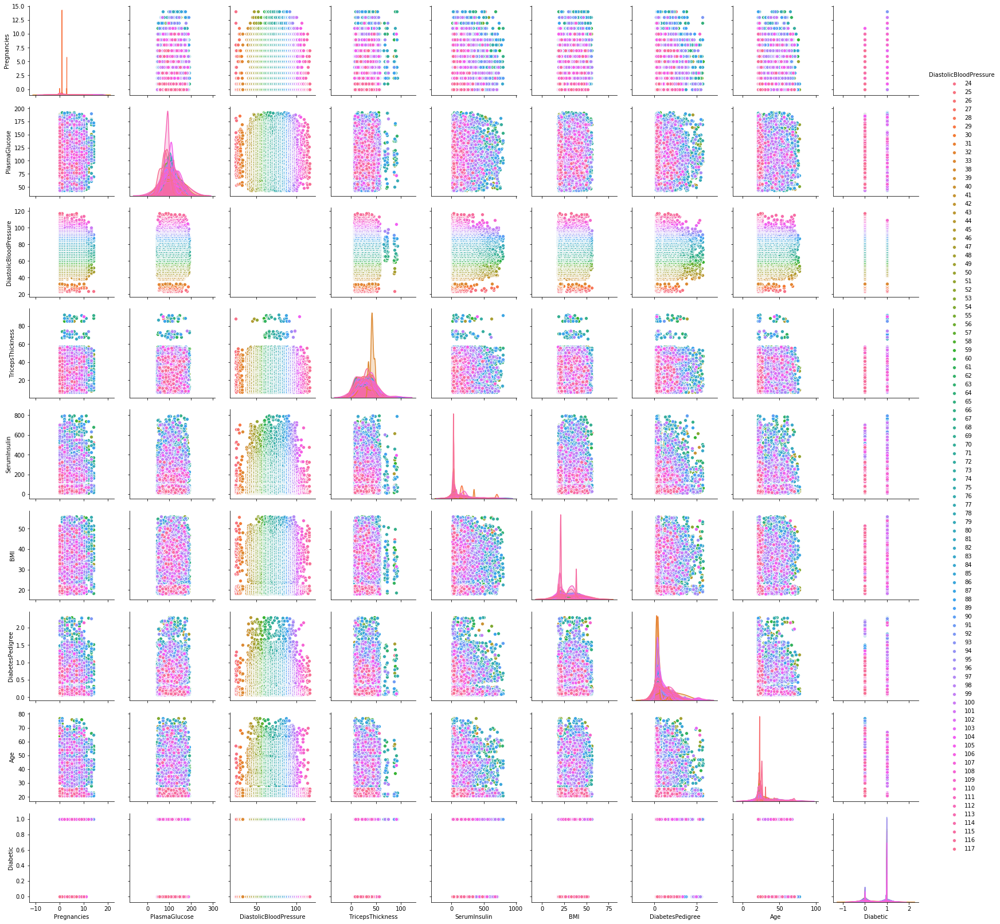

In [33]:
sns.pairplot(df.iloc[:,1:10], hue="DiastolicBloodPressure")

/usr/local/python/2.7-conda5.2/lib/python2.7/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/usr/local/python/2.7-conda5.2/lib/python2.7/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


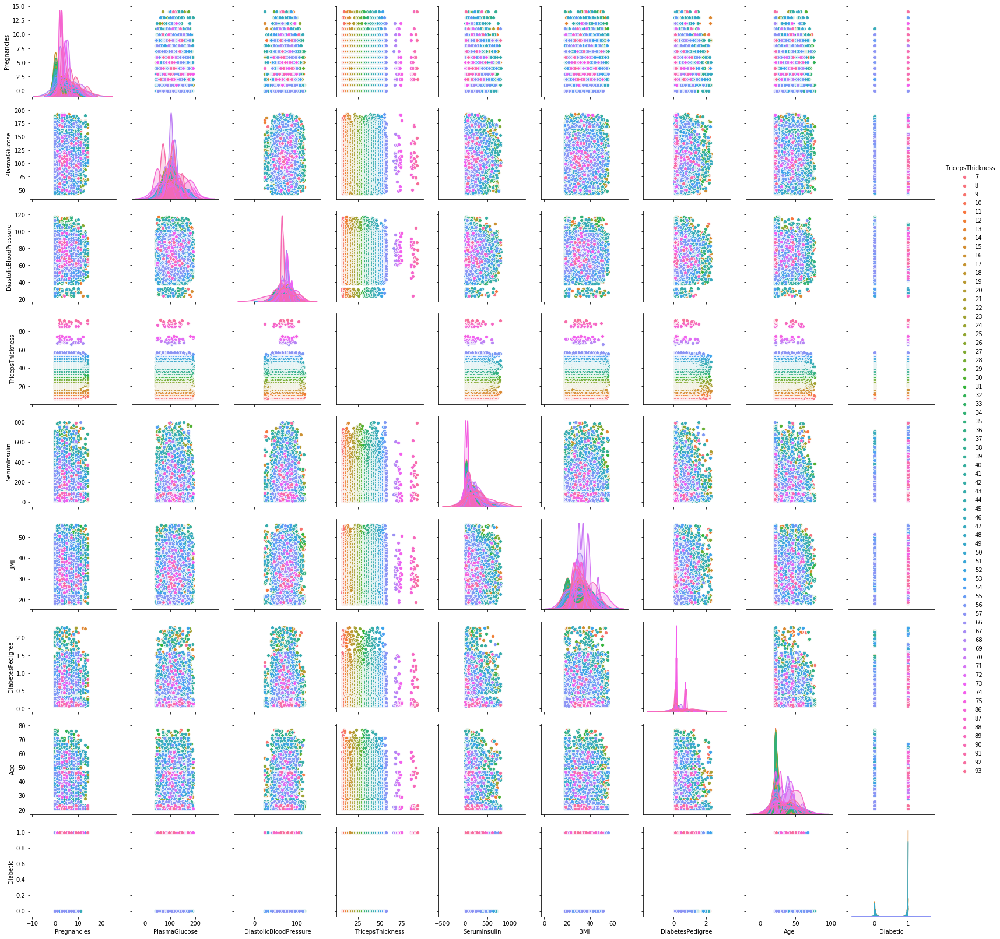

In [34]:
sns.pairplot(df.iloc[:,1:10], hue="TricepsThickness")

### 5. Dimensionality Reduction: PCA

Using diabetes data (exclude PatientID and Diabetic attributes), perform PCA, select 2 components, and project the data. You may use the PCA function from the sklearn package. Plot the projected data and comment if the data for the two groups (Diabetic=0 and Diabetic=1) of Diabetic attribute are  well seggreated in the principal components space.

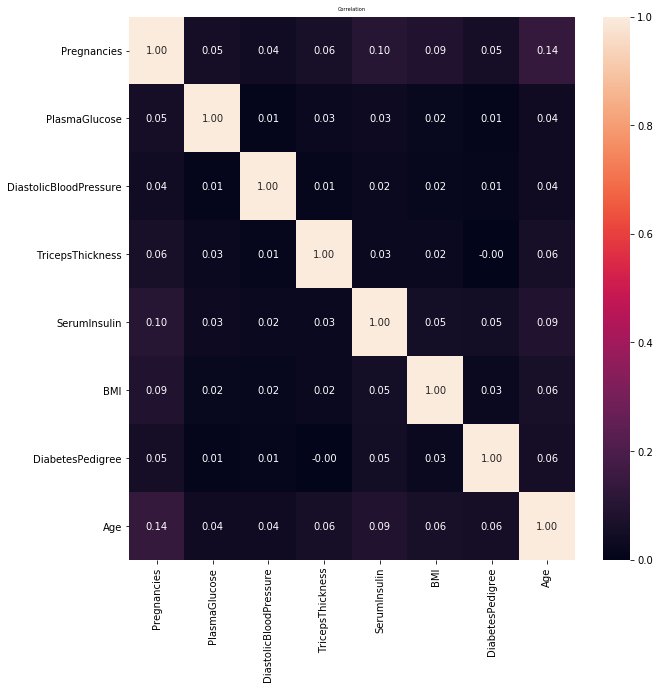

In [22]:
fig = plt.figure(figsize = (10,10))
ax = fig.gca()
sns.heatmap(df.iloc[:,1:9].corr(), annot=True, fmt=".2f")
plt.title("Correlation",fontsize=5)
plt.show()

In [23]:
pca = PCA(2)  # project from 64 to 2 dimensions
projected = pca.fit_transform(df.iloc[:,1:9])
print(df.shape)
print(projected.shape)   

(15000, 10)
(15000, 2)


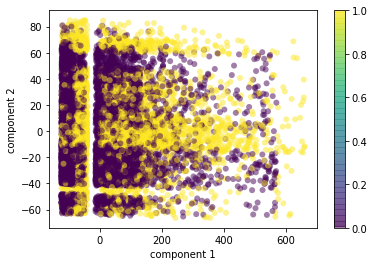

In [31]:
df['Diabetic'] = df['Diabetic'].astype('category',copy=False)
plt.scatter(projected[:, 0], projected[:,1],
            c=df['Diabetic'], edgecolor='none', alpha=0.5
            )
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar();

### 6. Singular Value Decomposition

Using the following matrix A, write your own SVD function to factorize the matrix into U,S, and V. You may use the PCA function that is available in the sklearn package.

In [3]:
A = np.array([
    [1, 1, 1, 0, 0],
    [3, 3, 3, 0, 0],
    [4, 4, 4, 0, 0],
    [5, 5, 5, 0, 0],
    [0, 2, 0, 4, 4],
    [0, 0, 0, 5, 5],
    [0, 1, 0, 2, 2]])

In [5]:
A_t=np.transpose(A)
U = np.matmul(A,A_t)
U

u1, u2 = np.linalg.eig(U)
print u2

[[-1.37599126e-01  2.36114514e-02 -1.08084718e-02  1.63762930e-01
   3.00924025e-01 -8.49660260e-02  9.32603927e-17]
 [-4.12797378e-01  7.08343543e-02 -3.24254153e-02 -6.59023208e-01
   2.09784654e-01  1.47281072e-02 -5.08560393e-17]
 [-5.50396503e-01  9.44458057e-02 -4.32338870e-02  7.05754513e-01
   6.26760355e-01  7.81922872e-01 -2.03011610e-15]
 [-6.87995629e-01  1.18057257e-01 -5.40423588e-02 -2.01942272e-01
  -6.87463881e-01 -6.17381956e-01  1.63289263e-15]
 [-1.52775087e-01 -5.91100963e-01  6.53650843e-01  2.59880379e-16
   3.36522287e-16  5.55580521e-16 -4.47213595e-01]
 [-7.22165140e-02 -7.31311857e-01 -6.78209218e-01 -2.30053685e-16
  -3.39003068e-16 -3.85701908e-16  2.17895740e-17]
 [-7.63875433e-02 -2.95550482e-01  3.26825421e-01  2.12924222e-16
   2.95991350e-16  3.81522922e-17  8.94427191e-01]]


In [ ]:
mu = A.mean(axis=1)
A_c = A - mu
A_c_t = np.transpose(A_c)
V= np.matmul(A_c_t,A_c)
V

v1,v2 = np.linalg.eig(V)
print v2

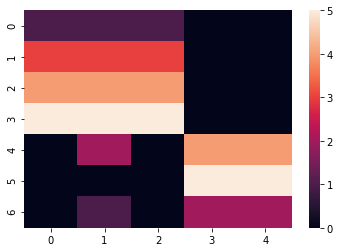

In [41]:
sns.heatmap(A)

In [42]:
U, S, V = svd(A, full_matrices = False)

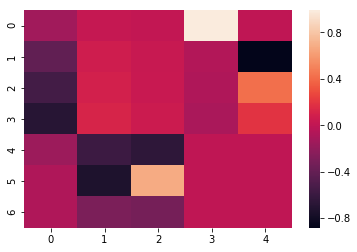

In [43]:
sns.heatmap(U)

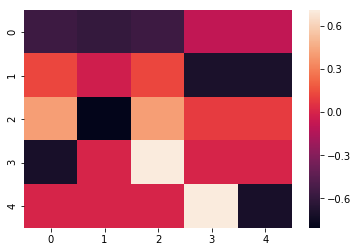

In [44]:
sns.heatmap(V)

Text(0,0.5,'Variance')

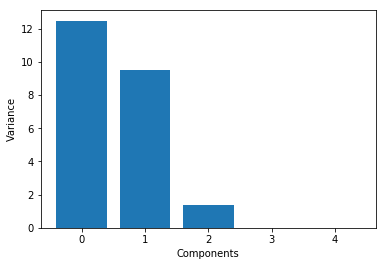

In [45]:
plt.bar(np.arange(5),S)
plt.xlabel('Components')
plt.ylabel('Variance')

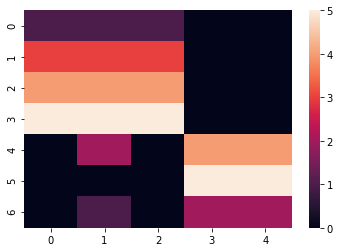

In [46]:
sns.heatmap(np.matmul(np.matmul(U,np.diag(S)), V))

### 7. Linear Discriminant Analysis

Using diabetes data (exclude PatientID attribute), perform LDA.  You may use the LinearDiscriminantAnalysis function from the sklearn package. Plot the data and comment if a good separation between points that belong to Diabetic=0 and Diabetic=1 has been achieved.

Comment- As we can see a lot of overlap between the data points, a good separation is not achieved that belong to Diabetic = 0 and Diabetic = 1.Comment- As we can see a lot of overlap between the data points, a good separation is not achieved that belong to Diabetic = 0 and Diabetic = 1.

In [35]:
X = df.values[:,0:8]
y = df['Diabetic'] 
lda = LinearDiscriminantAnalysis(n_components=2)

X = X[4001:5001,:]
y = y[4001:5001]
X_r1 = lda.fit(X, y).transform(X)

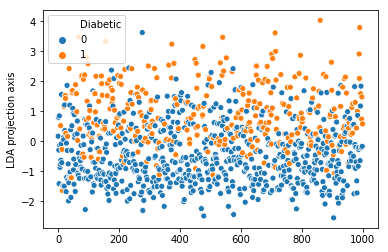

In [36]:
fig = sns.scatterplot(x=np.arange(np.size(X_r1)),y=X_r1[:,0],hue=y)
plt.ylabel('LDA projection axis')
plt.show(fig)

In [37]:
pca = PCA(n_components=2)
X_r2 = pca.fit(X).transform(X)

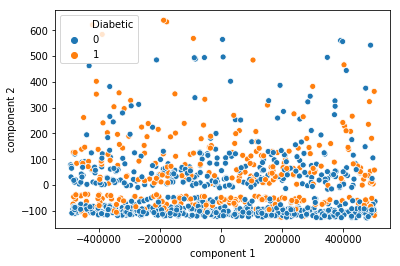

In [38]:
fig=sns.scatterplot(x=X_r2[:,0],y=X_r2[:,1],hue=y)
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.show(fig)